In [ ]:
pip install torchmetrics

In [ ]:
pip install segmentation-models-pytorch

In [ ]:
pip install certifi

In [ ]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

In [ ]:
!pip install pytorch_lightning

**Import libraries**

In [ ]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import torchvision
from torchvision import transforms
import torchvision.transforms as T
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader,random_split
import numpy as np
import torch
import torch.nn as nn
from PIL import Image
import os
import matplotlib.image as mpimg
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torchmetrics
import segmentation_models_pytorch as smp
from pytorch_lightning import seed_everything, LightningModule, Trainer
from pytorch_lightning.callbacks import EarlyStopping,ModelCheckpoint,LearningRateMonitor, Callback



In [ ]:
def read_cam_images(file_path):

  img_files = [im_frame.replace('.png','') for im_frame in os.listdir(file_path) if not im_frame.endswith('L.png')]
  #mode = torchvision.io.image.ImageReadMode.RGB

  images, labels =[], []

  for i, fname in enumerate(img_files):
    images.append(cv2.imread( os.path.join(file_path,fname+'.png'))) # append image
    labels.append(cv2.imread( os.path.join(file_path,fname+'_L.png'))) # append label

  return images, labels



**Load and Print number of training and test samples**

In [ ]:
train_path = "/content/drive/MyDrive/Cam101/Cam101/train"
test_path = "/content/drive/MyDrive/Cam101/Cam101/test"

# Read the training set from file path
train_images, train_labels = read_cam_images(train_path)

# Read the testing set from file path
test_images, test_labels = read_cam_images(test_path)


# Print number of training samples
print(f'Number of training samples : %d'% len(train_images))

# Print number of training samples
print(f'Number of test samples : %d'% len(test_images))

total = len(train_images)+len(test_images)
# Print total number of samples
print(f'Total number of samples : %d'% total)


Number of training samples : 90
Number of test samples : 11
Total number of samples : 101


**Create A Custom Dataset**

In [ ]:
# Define A custom dataset

class ImageDataset(Dataset):

  def __init__(self, images, labels, augmentation=None, preprocessing=None):
    self.images = images
    self.labels = labels
    self.augmentation = augmentation
    self.preprocessing = preprocessing

  def __len__ (self):
    return len(self.images)

  def __getitem__(self, i):
    image = cv2.cvtColor(self.images[i],cv2.COLOR_BGR2RGB)
    label = cv2.cvtColor(self.labels[i],cv2.COLOR_BGR2RGB)

    if self.augmentation and self.preprocessing:
      sample = self.augmentation(image = image, mask= label)
      image, label = sample ['image'], sample['mask']

      sample = self.preprocessing(image=image, mask=label)
      image, label = sample['image'], sample['mask']
      return image, cam_label_indices(label,cam_colormap2label())

    elif self.augmentation:
      sample = self.augmentation(image = image, mask= label)
      image, label = sample ['image'], sample['mask']
      return image, label
    else:
      return image, label




**Function to read label mapping from file path on Drive**

In [ ]:


def read_labels():
  label_path ="/content/drive/MyDrive/Cam101/Cam101/label_colors.txt"
  labels = {}
  with open(label_path, 'r') as f:
      for line in f:
          r, g, b, label = line.split()
          label = label.strip()
          labels[(int(r), int(g), int(b))] = label
  return labels

color = read_labels()
# classes
CLASSES = list(color.values())
rgb = list(color.keys())
# colors
COLOR_MAP =[]
for color in rgb:
  COLOR_MAP.append(list(color))



**Function to map label indices to images**

In [ ]:

def cam_colormap2label():

  colormap2label = torch.zeros(256 ** 3, dtype=torch.long)
  for i, colormap in enumerate(COLOR_MAP):
      r, g, b = colormap
      idx = (r * 256 + g) * 256 + b
      colormap2label[idx] = i
  return colormap2label

# Colormap is the RGB value in the image, which is converted into the corresponding label value
def cam_label_indices(colormap, colormap2label):
  colormap = colormap.numpy().astype('int32')
  r, g, b = np.split(colormap, 3, axis=2)
  idx = ((r * 256 + g) * 256 + b).squeeze()
  return colormap2label[idx]



In [ ]:

# Function to plot images
def visualize(**images):

    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        if image.shape[0] == 3:
          image =np.transpose(image,(1,2,0))
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

**Print some sample from training dataset**

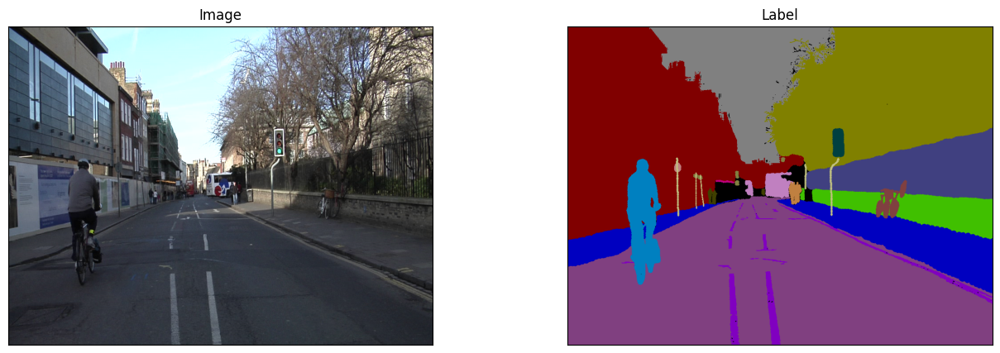

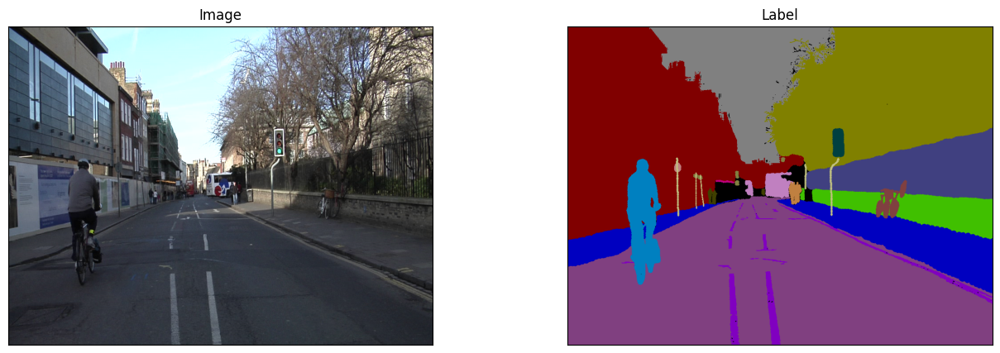

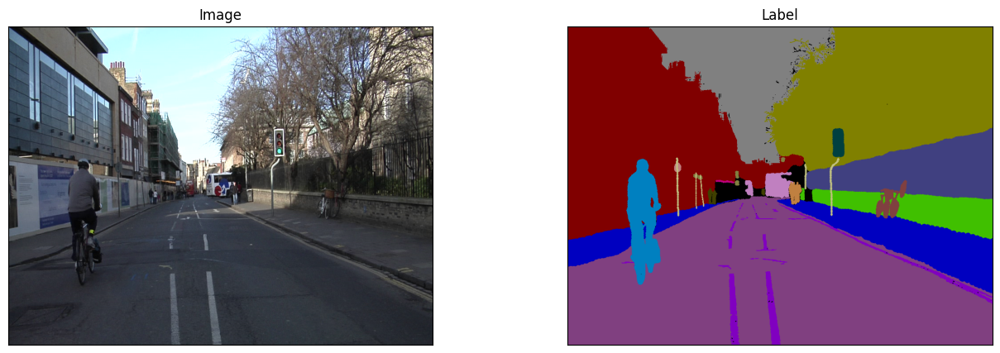

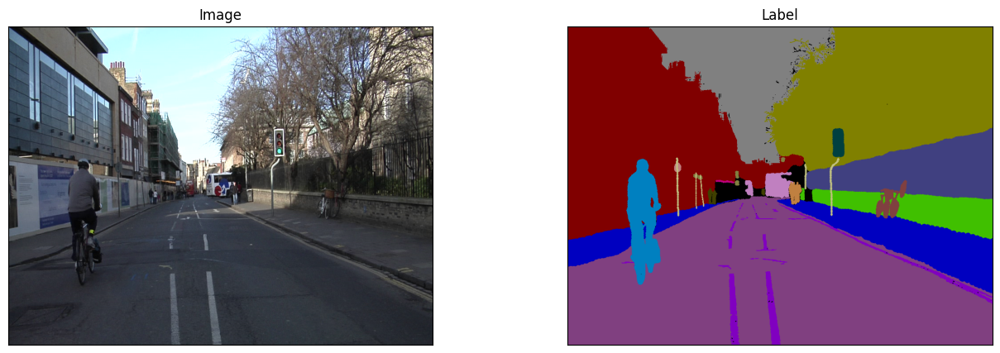

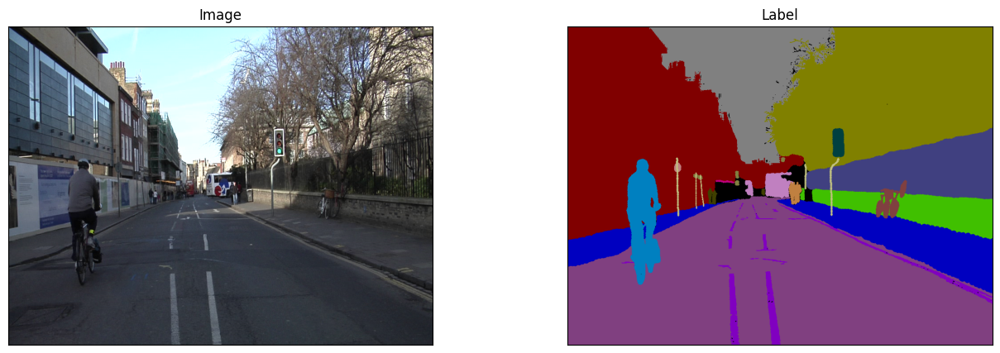

In [ ]:
train_dataset = ImageDataset(train_images, train_labels)


for i in range(5):
  image, mask = train_dataset[4]
  visualize(image=image, Label = mask.squeeze())


**Print some test samples**

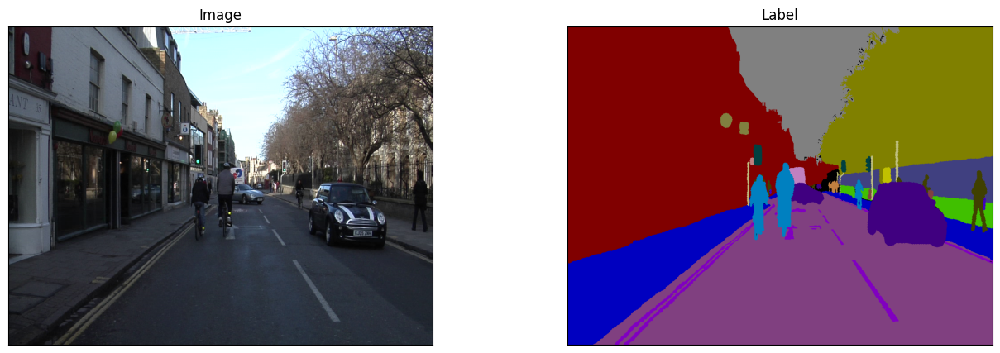

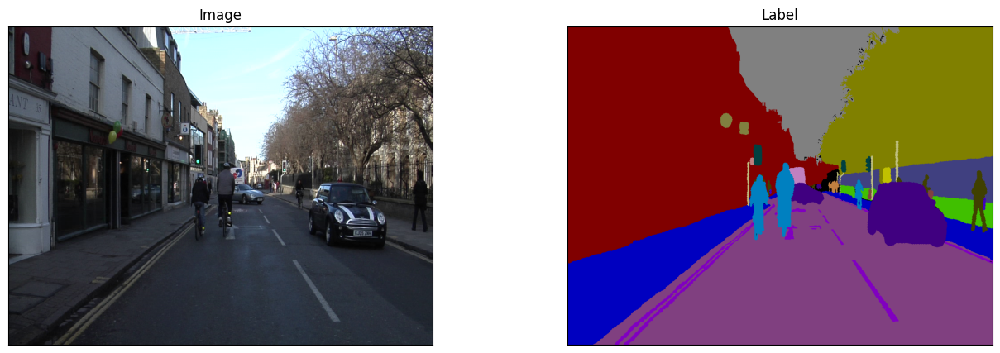

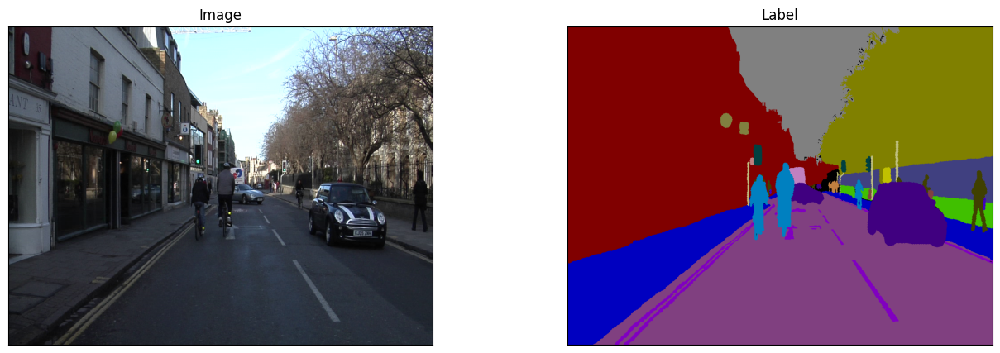

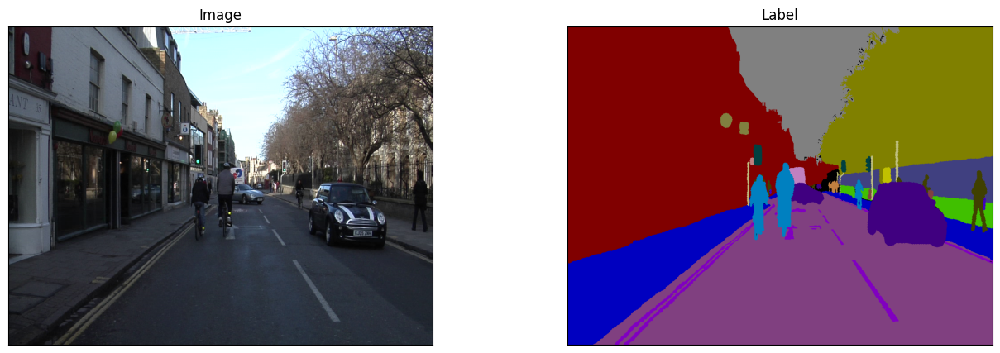

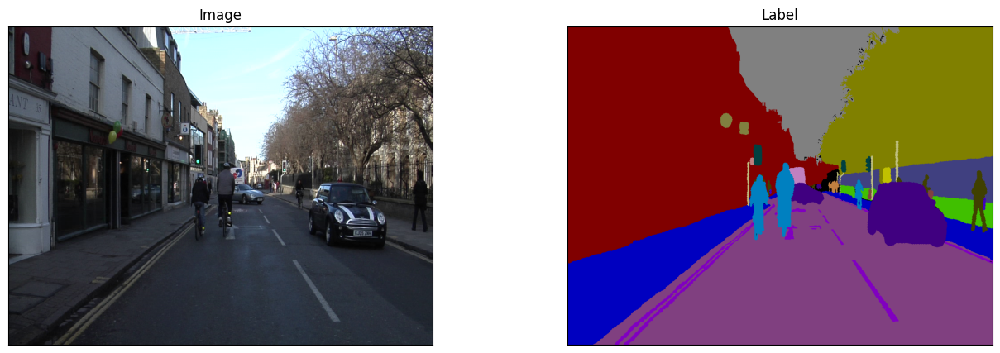

In [ ]:
test_dataset = ImageDataset(test_images, test_labels)

for i in range(5):
  image, mask = test_dataset[4]
  visualize(image=image, Label = mask.squeeze())

**Define data augmentation for training samples**

In [ ]:
# Augmentation function to expand training samples
def augment():
  transform = A.Compose([
      A.Rotate(limit=40, p=0.5),
      A.HorizontalFlip(p=0.5),
      A.VerticalFlip(p=0.1),
      A.RandomCrop(height=256, width=256),
      A.IAAAdditiveGaussianNoise(p=0.2),
      A.OneOf(
                [
                    A.CLAHE(p=1),
                    A.RandomBrightness(p=1),
                    A.RandomGamma(p=1),
                ],
                p=0.9,
            ),
      A.OneOf(
              [
                  A.IAASharpen(p=1),
                  A.Blur(blur_limit=3, p=1),
                  A.MotionBlur(blur_limit=3, p=1),
              ],
              p=0.9,
          ),
      A.OneOf(
              [
                  A.RandomContrast(p=1),
                  A.HueSaturationValue(p=1),
              ],
              p=0.9,
          ),

    ])
  return transform

# Apply standard normalization for models  and Change to tensor

def preprocess_image():
  preprocess = A.Compose([
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()

  ])
  return preprocess




**Split Augmented dataset and build train and validation Dataloaders**

In [ ]:
# Build training dataset with augmentation and preprocess it
training_data = ImageDataset(train_images,train_labels, augmentation=augment(), preprocessing=preprocess_image())

# Get train and validation split ratios 90% vs 10%
train_size = int(0.9 * len(training_data))
val_size = len(training_data) - train_size

# Split augmented dataset into training set and validation set
trainset, valset = random_split(training_data, [train_size, val_size])

# see everything for reproducibility
seed_everything(seed=42)

# Build train and validation loaders
train_loader = DataLoader(trainset, batch_size=8, shuffle=True)
valid_loader = DataLoader(valset, batch_size=1, shuffle=False) # validation data



**Prepare test dataset and loader**

In [ ]:
test_transform = A.Compose([
      A.Resize(256,256)])

test_data = ImageDataset(test_images,test_labels, augmentation=test_transform, preprocessing=preprocess_image())
test_loader = DataLoader(test_data, batch_size=1, shuffle=False)

**Get number classes in indices**

In [ ]:
# Get class labels as index
class_values = [CLASSES.index(cls) for cls in CLASSES]

class_map = dict(zip(class_values, range(len(class_values))))
n_classes=len(class_values)

label_colours = dict(zip(range(n_classes), COLOR_MAP))

n_classes=len(CLASSES)

**Set up Pytorch Lightning for our models**

In [ ]:
class SegmentModel(LightningModule):
    def __init__(self, arch, criterion = nn.CrossEntropyLoss()):
        super(SegmentModel, self).__init__()
        # Architecture
        self.layer = arch

        # Parameters
        self.lr = 1e-3
        self.batch_size = 8
        self.criterion = criterion  # Loss function
        self.metrics = torchmetrics.JaccardIndex(task='multiclass', num_classes=n_classes) # Iou

        # Initialize lists for storing  losses and metrics
        self.train_losses = []
        self.train_ious = []
        self.train_accuracies = []
        self.val_losses = []
        self.val_ious = []
        self.val_accuracies = []

        self.avg_train_losses = []
        self.avg_train_ious = []
        self.avg_train_accuracies = []
        self.avg_val_losses = []
        self.avg_val_ious = []
        self.avg_val_accuracies = []

        self.test_predictions = []

    def process(self, image, segment):
        out = self(image)
        loss = self.criterion(out, segment.long())
        iou = self.metrics(out, segment)
        accuracy = self.pixel_accuracy(out, segment)

        return loss, iou, accuracy

    # Function to calculate pixel-wise Accuracy
    def pixel_accuracy(self, output, target):
        _, predicted = torch.max(output, dim=1)
        correct = (predicted == target).sum().item()
        total_pixels = target.numel()
        accuracy = correct / total_pixels
        return accuracy * 100

    # Overide training step
    def training_step(self, batch, batch_idx):
        image, segment = batch
        loss, iou, accuracy = self.process(image, segment)
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)

        # Store metrics in lists
        self.train_losses.append(loss.item())
        self.train_ious.append(iou.item())
        self.train_accuracies.append(accuracy)
        return loss

    # Overide validation step
    def validation_step(self, batch, batch_idx):
        image, segment = batch
        loss, iou, accuracy = self.process(image, segment)
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)

        # Store metrics in lists
        self.val_losses.append(loss.item())
        self.val_ious.append(iou.item())
        self.val_accuracies.append(accuracy)

        return loss

    def forward(self, x):
        return self.layer(x)

    # set up optimizer
    def configure_optimizers(self):
        opt = torch.optim.AdamW(self.parameters(), lr=self.lr)
        return opt

    def train_dataloader(self):
        train_loader = DataLoader(trainset, batch_size=self.batch_size, shuffle=True)
        return train_loader

    def val_dataloader(self):
        val_loader = DataLoader(valset, batch_size=1, shuffle=False)
        return val_loader

    def on_train_epoch_end(self):
        # Calculate mean metrics per epoch
        avg_train_loss = torch.tensor(self.train_losses).mean().item()
        avg_train_iou = torch.tensor(self.train_ious).mean().item()
        avg_train_accuracy = torch.tensor(self.train_accuracies).mean().item()
        self.avg_train_losses.append(avg_train_loss)
        self.avg_train_ious.append(avg_train_iou)
        self.avg_train_accuracies.append(avg_train_accuracy)

        # Clear the lists for the next epoch
        self.train_losses = []
        self.train_ious = []
        self.train_accuracies = []

        self.log('train_loss_epoch', avg_train_loss, prog_bar=True)
        self.log('train_iou_epoch', avg_train_iou, prog_bar=True)
        self.log('train_accuracy_epoch', avg_train_accuracy, prog_bar=True)

    def on_validation_epoch_end(self):
        # Calculate mean metrics per epoch
        avg_val_loss = torch.tensor(self.val_losses).mean().item()
        avg_val_iou = torch.tensor(self.val_ious).mean().item()
        avg_val_accuracy = torch.tensor(self.val_accuracies).mean().item()
        self.avg_val_losses.append(avg_val_loss)
        self.avg_val_ious.append(avg_val_iou)
        self.avg_val_accuracies.append(avg_val_accuracy)


        # Clear the lists for the next epoch
        self.val_losses = []
        self.val_ious = []
        self.val_accuracies = []

        self.log('val_loss_epoch', avg_val_loss, prog_bar=True)
        self.log('val_iou_epoch', avg_val_iou, prog_bar=True)
        self.log('val_accuracy_epoch', avg_val_accuracy, prog_bar=True)

    def test_step(self, batch, batch_idx):
        image, segment = batch
        output = self(image)
        loss, iou, accuracy = self.process(image, segment)
        self.log('test_loss', loss, on_step=False, on_epoch=True)
        self.log('test_iou', iou, on_step=False, on_epoch=True)
        self.log('test_accuracy', accuracy, on_step=False, on_epoch=True)
        self.test_predictions.append(output)

        return output
    # set up for prediction
    def predict_step(self, batch, batch_idx, dataloader_idx=0):
        return self(batch)


**Function to Plot losses and metrics**

In [ ]:
import matplotlib.pyplot as plt

def plot_metric(train, val, metric='Loss'):
    epochs = range(1, len(train) + 1)

    plt.plot(epochs, train, label='Train '+metric)
    plt.plot(epochs, val, label='Validation '+ metric)
    plt.xlabel('Epoch')
    plt.ylabel(metric)
    plt.title('Training and Validation '+ metric)
    plt.legend()
    plt.show()

**Define UNET Architecture wit resnet34 backbone - pretrained**

In [ ]:
# Define architecture
UNet_resnet34 = smp.Unet(
                encoder_name="resnet34",        # choose encoder
                encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
                in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
                classes=n_classes,                      # model output channels (number of classes in your dataset)
            )

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 323MB/s]


In [ ]:
model = SegmentModel(UNet_resnet34)

**Set up trainer and use GPU**

In [ ]:
trainer = Trainer(max_epochs= 20, accelerator="cuda")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


**Train UNet model**

In [ ]:
import time



start = time.time()
trainer.fit(model)

end = time.time()

train_time = (end - start)/60

print("Training time: {:.2f} minutes".format(train_time))

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type                   | Params
-----------------------------------------------------
0 | layer     | Unet                   | 24.4 M
1 | criterion | CrossEntropyLoss       | 0     
2 | metrics   | MulticlassJaccardIndex | 0     
-----------------------------------------------------
24.4 M    Trainable params
0         Non-trainable params
24.4 M    Total params
97.763    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Training time: 7.25 minutes


In [ ]:
torch.save(model.state_dict(), 'model.pth')

In [ ]:

train_ious = model.avg_train_ious
train_accuracies = model.avg_train_accuracies
train_losses = model.avg_train_losses

val_ious = model.avg_val_ious[1:]
val_accuracies = model.avg_val_accuracies[1:]
val_losses = model.avg_val_losses[1:]



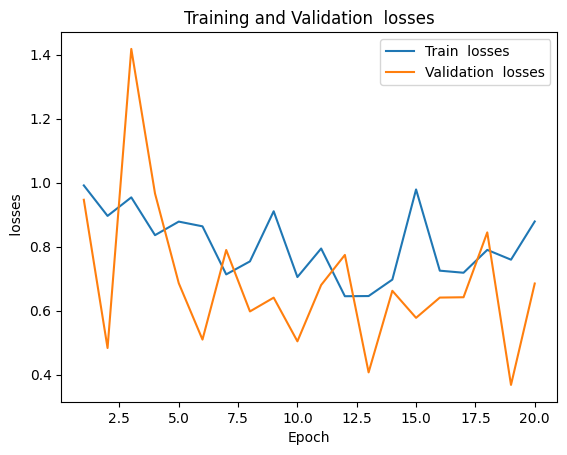

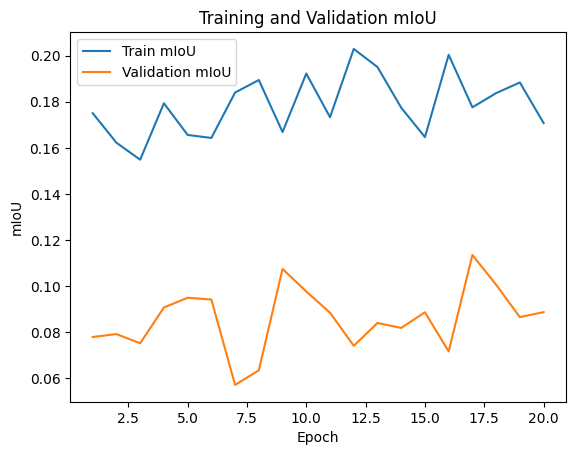

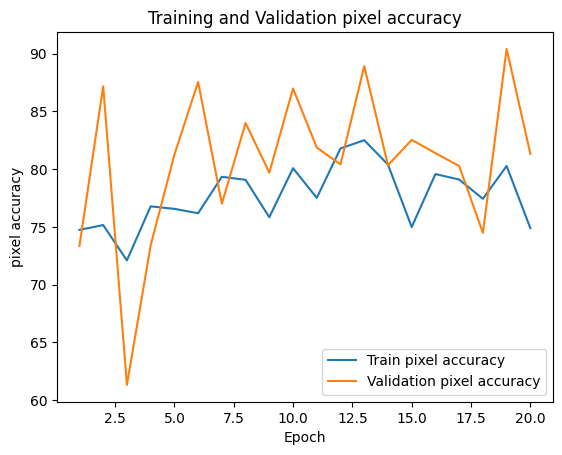

In [ ]:
plot_metric(train_losses, val_losses," losses")
plot_metric(train_ious, val_ious,"mIoU")
plot_metric(train_accuracies, val_accuracies,"pixel accuracy")

**Evaluating the UNet model**

In [ ]:
trainer.test(dataloaders= test_loader)


INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/lightning_logs/version_20/checkpoints/epoch=19-step=220.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/lightning_logs/version_20/checkpoints/epoch=19-step=220.ckpt


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │     85.17261505126953     │
│         test_iou          │    0.17362013459205627    │
│         test_loss         │    0.5146703124046326     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.5146703124046326,
  'test_iou': 0.17362013459205627,
  'test_accuracy': 85.17261505126953}]

In [ ]:

# Get preictions of the model
predictions = model.test_predictions

def cam_label_indices_to_rgb(label_indices, label2colormap):
    label_indices = label_indices.long().view(-1)  # Convert to LongTensor and reshape
    rgb = torch.zeros((3, 256, 256), dtype=torch.uint8)
    for i, index in enumerate(label_indices):
        row = i // 256
        col = i % 256
        if row < 256 and col < 256:
            rgb[:, row, col] = torch.tensor(label2colormap[index])
    return rgb

def retrieve_image(prediction):
  argmax_predictions = torch.argmax(prediction, dim=1)
  image = argmax_predictions.squeeze().byte()  # Shape: [256, 256]
  image = image.unsqueeze(0).expand(3, -1, -1)
  return cam_label_indices_to_rgb(image,COLOR_MAP)


**Compare predictions with label**

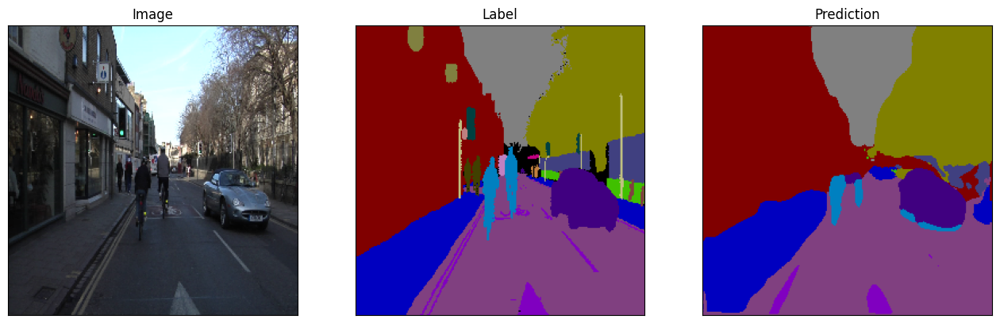

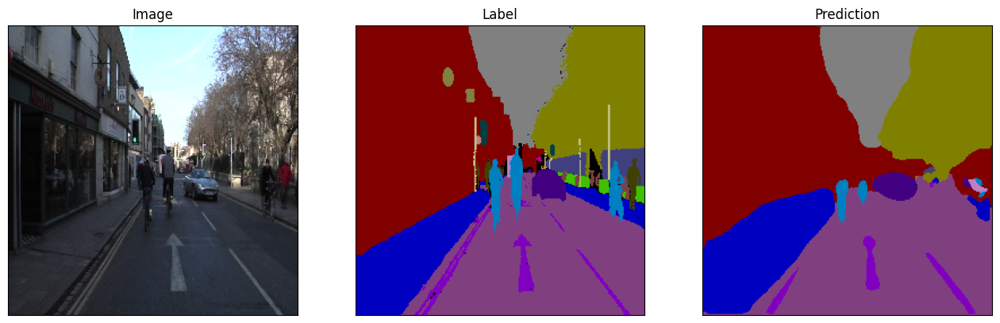

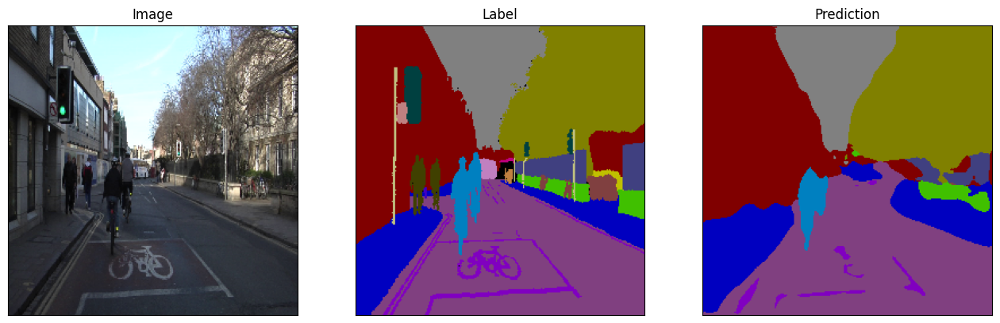

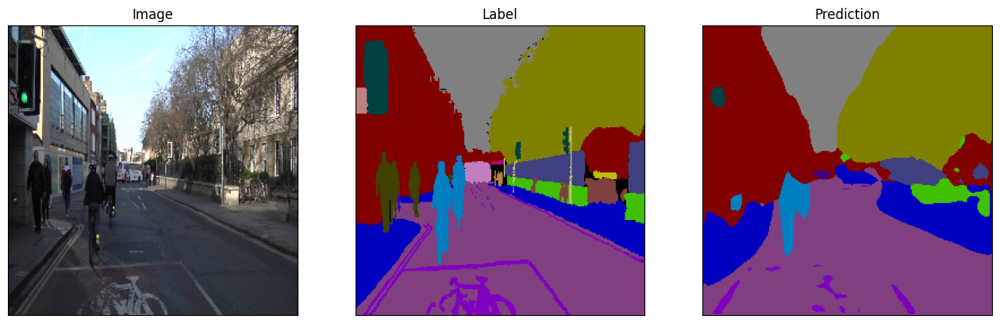

In [ ]:
test_sample = ImageDataset(test_images,test_labels, augmentation= A.Compose([A.Resize(256,256)]))

for i in range(4):
    image, label= test_sample[i]
    prediction = retrieve_image(predictions[i])
    visualize(image=image, label=label, prediction=prediction)


**Define FCN model with inceptionresnetv2 backbone**

In [ ]:
FCN_incept= smp.FPN(
                encoder_name="inceptionresnetv2",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
                encoder_weights="imagenet",
                activation='softmax',     # use `imagenet` pre-trained weights for encoder initialization
                in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
                classes=n_classes,                      # model output channels (number of classes in your dataset)
            )

In [ ]:
model2 = SegmentModel(FCN_incept)


trainer = Trainer(max_epochs=8, accelerator="cuda")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


**Train model**

In [ ]:
import time

start = time.time()
trainer.fit(model2)

end = time.time()

train_time = (end - start)/60

print("Training time: {:.2f} minutes".format(train_time))

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type                   | Params
-----------------------------------------------------
0 | layer     | FPN                    | 56.7 M
1 | criterion | CrossEntropyLoss       | 0     
2 | metrics   | MulticlassJaccardIndex | 0     
-----------------------------------------------------
56.7 M    Trainable params
0         Non-trainable params
56.7 M    Total params
226.953   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=8` reached.


Training time: 3.92 minutes


In [ ]:
torch.save(model2.state_dict(), 'model2.pth')

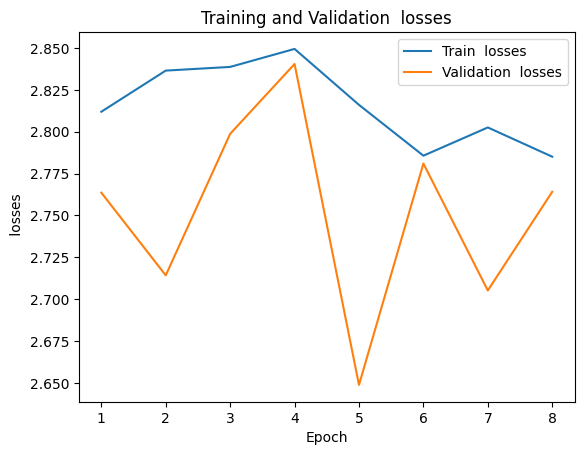

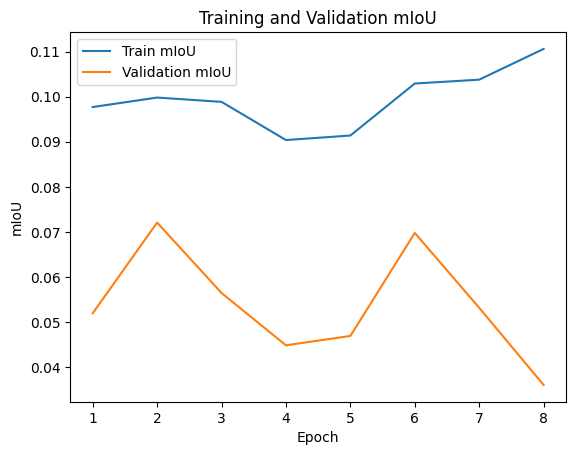

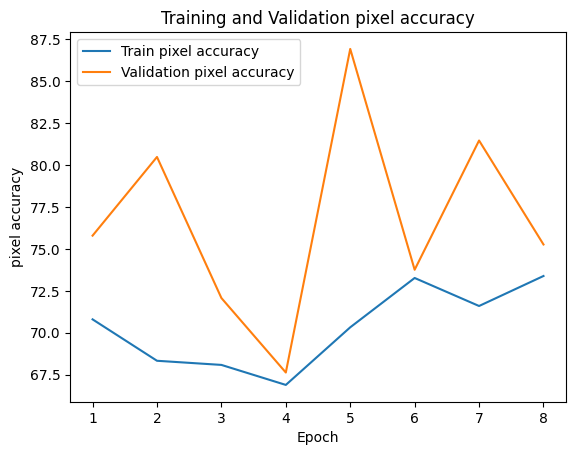

In [ ]:
train_ious = model2.avg_train_ious
train_accuracies = model2.avg_train_accuracies
train_losses = model2.avg_train_losses

val_ious = model2.avg_val_ious[1:]
val_accuracies = model2.avg_val_accuracies[1:]
val_losses = model2.avg_val_losses[1:]

plot_metric(train_losses, val_losses," losses")
plot_metric(train_ious, val_ious,"mIoU")
plot_metric(train_accuracies, val_accuracies,"pixel accuracy")


In [ ]:
trainer.test(dataloaders= test_loader)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/lightning_logs/version_21/checkpoints/epoch=7-step=88.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/lightning_logs/version_21/checkpoints/epoch=7-step=88.ckpt


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │     67.38294982910156     │
│         test_iou          │    0.09446544945240021    │
│         test_loss         │    2.8470661640167236     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 2.8470661640167236,
  'test_iou': 0.09446544945240021,
  'test_accuracy': 67.38294982910156}]

In [ ]:
# Get preictions of the model
predictions = model2.test_predictions


**Compare prediction using FCN**

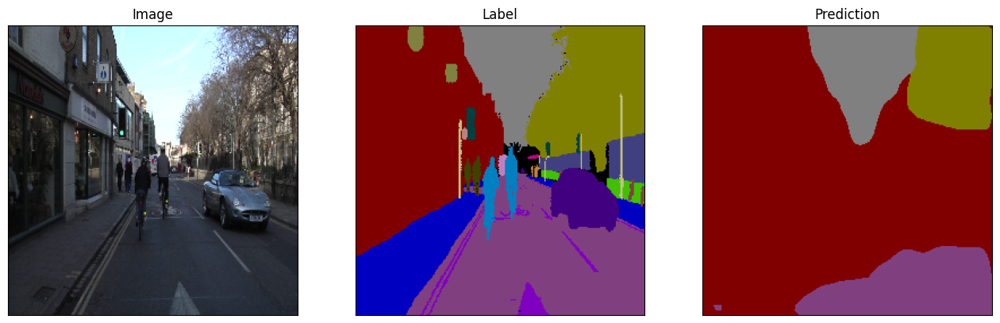

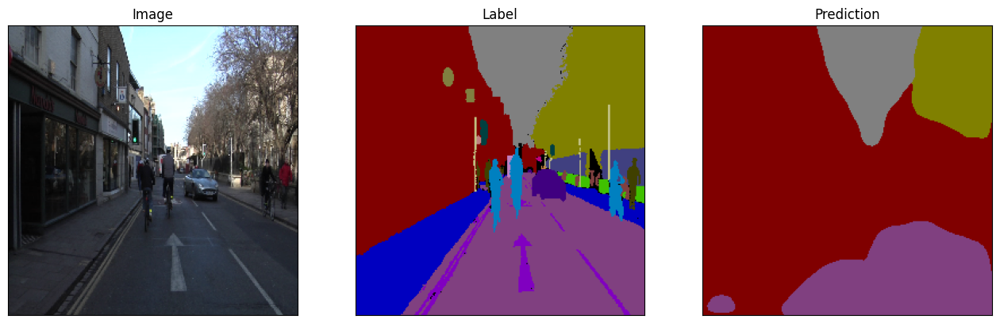

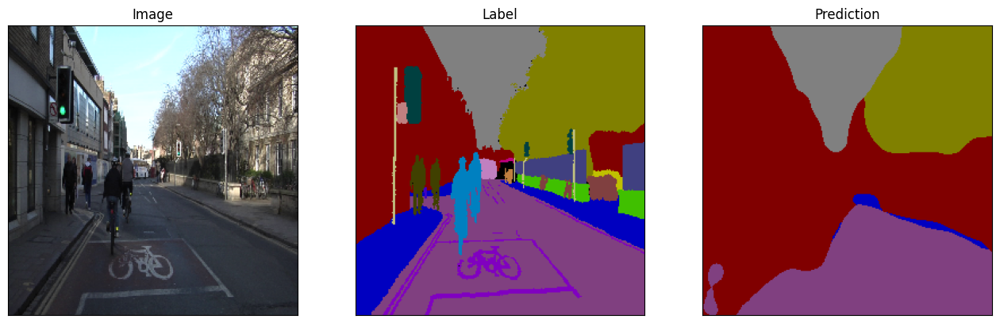

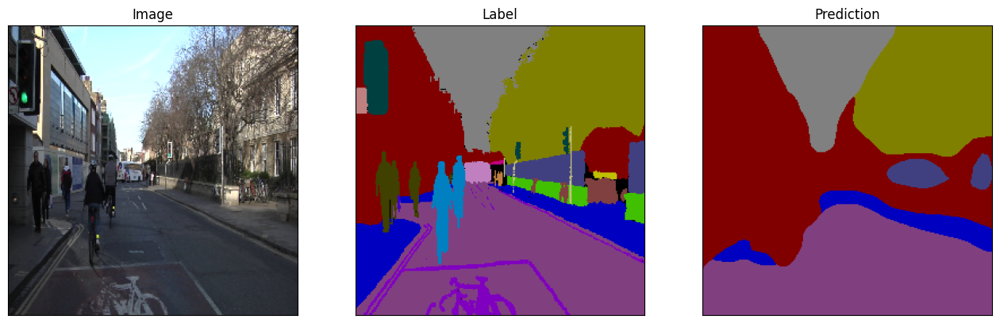

In [ ]:

for i in range(4):
    image, label= test_sample[i]
    prediction = retrieve_image(predictions[i])
    visualize(image=image, label=label, prediction=prediction)

**Define PSPNET with resnet50 backbone**

In [ ]:
PSP= smp.PSPNet(
                encoder_name="resnet50",
                encoder_weights="imagenet",
                in_channels=3,
                classes=n_classes,
            )

In [ ]:
loss_fn = smp.losses.DiceLoss(mode='multiclass')
model3 = SegmentModel(PSP, loss_fn)

In [ ]:
trainer3 = Trainer(max_epochs= 20, accelerator="cuda")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
import time

start = time.time()
trainer3.fit(model3)

end = time.time()

train_time = (end - start)/60

print("Training time: {:.2f} minutes".format(train_time))

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type                   | Params
-----------------------------------------------------
0 | layer     | PSPNet                 | 24.4 M
1 | criterion | DiceLoss               | 0     
2 | metrics   | MulticlassJaccardIndex | 0     
-----------------------------------------------------
24.4 M    Trainable params
0         Non-trainable params
24.4 M    Total params
97.775    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:280: PossibleUserWarning: The number of training batches (11) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Training time: 6.05 minutes


In [ ]:
train_ious = model3.avg_train_ious
train_accuracies = model3.avg_train_accuracies
train_losses = model3.avg_train_losses

val_ious = model3.avg_val_ious[1:]
val_accuracies = model3.avg_val_accuracies[1:]
val_losses = model3.avg_val_losses[1:]

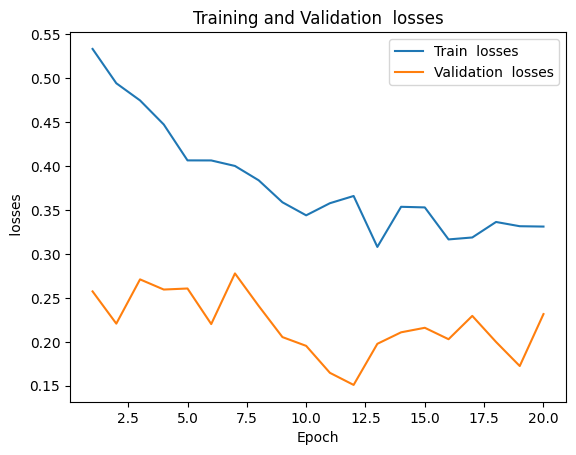

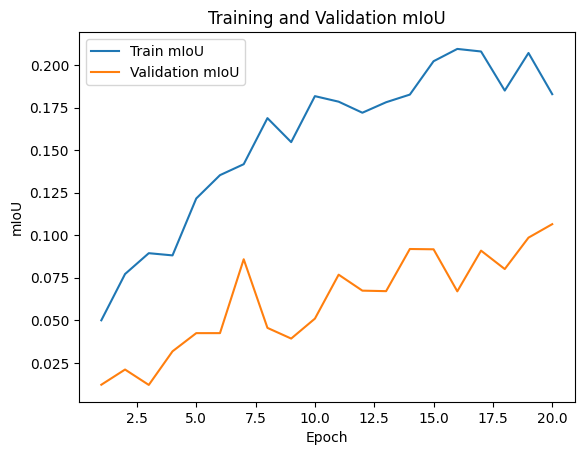

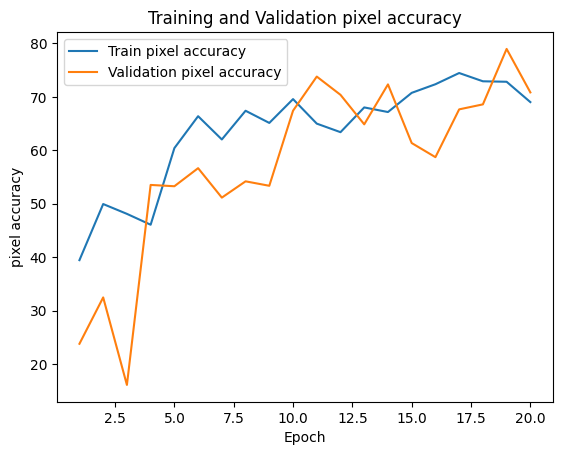

In [ ]:
plot_metric(train_losses, val_losses," losses")
plot_metric(train_ious, val_ious,"mIoU")
plot_metric(train_accuracies, val_accuracies,"pixel accuracy")

**Evaluating PSPNET**

In [ ]:
trainer3.test(dataloaders= test_loader)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/lightning_logs/version_16/checkpoints/epoch=19-step=220.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/lightning_logs/version_16/checkpoints/epoch=19-step=220.ckpt


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │     68.4059829711914      │
│         test_iou          │    0.1257517784833908     │
│         test_loss         │    0.4660446047782898     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.4660446047782898,
  'test_iou': 0.1257517784833908,
  'test_accuracy': 68.4059829711914}]

In [ ]:

# Get preictions of the model
predictions = model3.test_predictions



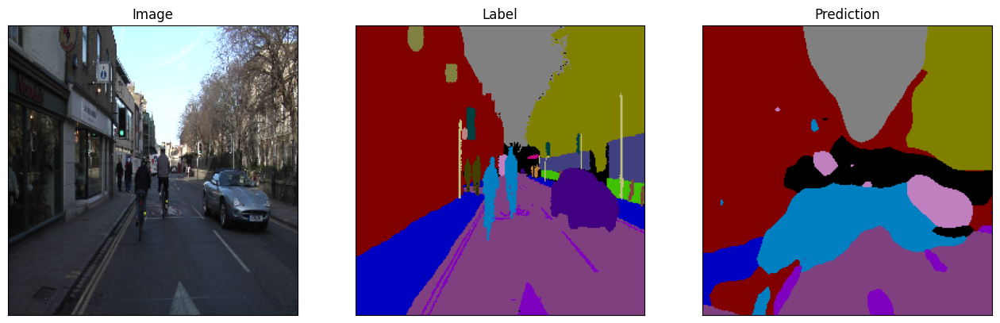

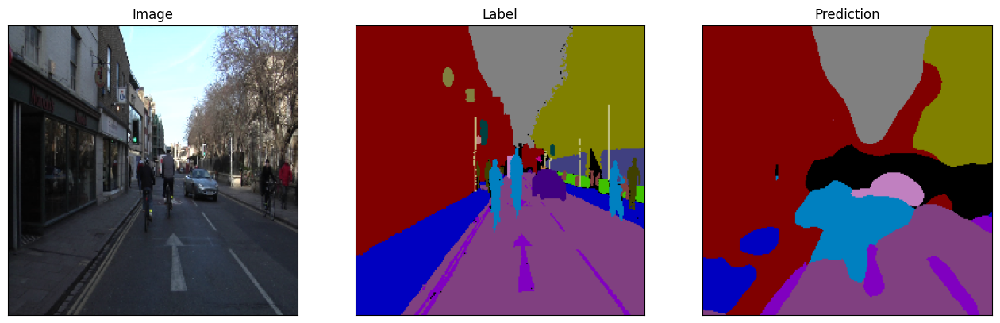

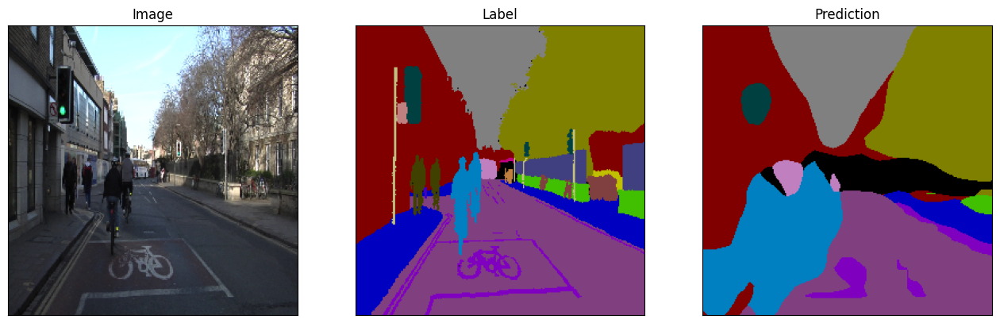

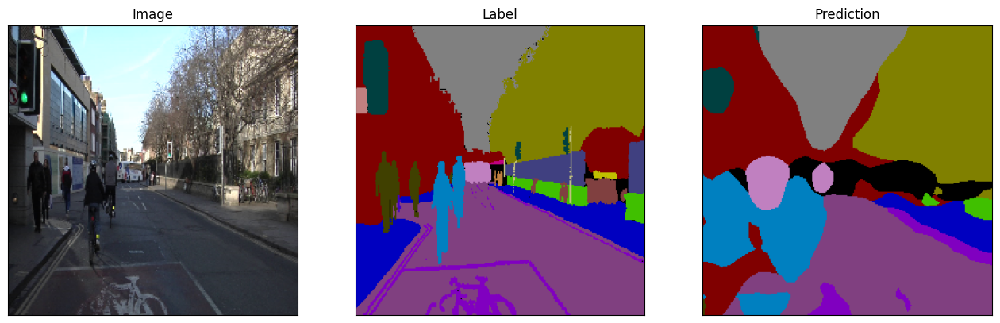

In [ ]:
# view image , label and prediction

for i in range(4):
    image, label= test_sample[i]
    prediction = retrieve_image(predictions[i])
    visualize(image=image, label=label, prediction=prediction)

In [2]:
!jupyter nbconvert --ClearMetadataPreprocessor.enabled=True --clear-output --inplace semanticsegmentation.ipynb

[NbConvertApp] WARNING | pattern 'semanticsegmentation.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes=True]
--ex